In [112]:
# Import libraries

import re
import os
import pandas as pd
pd.options.display.float_format = '{:,.4f}'.format

import numpy as np
from geopy.geocoders import Nominatim
import googletrans
from googletrans import Translator
import random
from random import sample
import warnings
warnings.filterwarnings('ignore')


import matplotlib as mpl
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
import seaborn as sns
import plotly.express as px


from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.cluster import MiniBatchKMeans
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.datasets import make_classification
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay, RocCurveDisplay
from sklearn.metrics import r2_score
from sklearn.compose import ColumnTransformer
from sklearn import preprocessing
from sklearn import utils
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, fbeta_score
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor

import scikit_posthocs as sp
from scipy import stats
from scipy.stats import mannwhitneyu

In [2]:
os.chdir(r'C:\Users\TrendingPC\Desktop\Posibles DB Proyecto Final')
df = pd.read_csv('Fets_penals_coneguts__fets_coneguts_resolts_i_detencions.csv')
df.head()

,Mes,Nom mes,Any,Regió Policial (RP),Àrea Bàsica Policial (ABP),Títol Codi Penal,Tipus de fet,Coneguts,Resolts,Detencions
0,1,gener,2021,RP Metropolitana Nord,ABP Arenys de Mar,De l’homicidi i les seves formes,Homicidi,0,1,1
1,1,gener,2021,RP Metropolitana Nord,ABP Arenys de Mar,De les falsedats,De la usurpació de l'estat civil,3,1,0
2,1,gener,2021,RP Metropolitana Nord,ABP Arenys de Mar,De les falsedats,Falsedats documentals,5,0,0
3,1,gener,2021,RP Metropolitana Nord,ABP Arenys de Mar,De les lesions,Lesions,39,33,7
4,1,gener,2021,RP Metropolitana Nord,ABP Arenys de Mar,De les tortures i altres delictes contra la in...,Tracte degradant / vexatori,2,1,1


# Data Cleaning

In [3]:
# Missing Values
df.isna().sum().sort_values(ascending=False)

#df = df.dropna()

Títol Codi Penal              456
Tipus de fet                  456
Mes                             0
Nom mes                         0
Any                             0
Regió Policial (RP)             0
Àrea Bàsica Policial (ABP)      0
Coneguts                        0
Resolts                         0
Detencions                      0
dtype: int64

In [4]:
# Duplicated Rows

print('Number of rows ' + str(df.shape[0]))

print('Number of duplicated rows ' + str(df.duplicated().value_counts()))

Number of rows 251676
Number of duplicated rows False    251676
dtype: int64


In [5]:
# Dropping the column 'Nom mes' because is redundant with the column 'Mes'

df = df.drop(columns= 'Nom mes')

In [6]:
# Rename the columns so they follow the PE8 (snake case).

# df.columns = [x.lower() for x in df.columns]
# df.columns = df.columns.str.replace(" ", "_", regex=True)

# EDA

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 251676 entries, 0 to 251675
Data columns (total 9 columns):
 #   Column                      Non-Null Count   Dtype 
---  ------                      --------------   ----- 
 0   Mes                         251676 non-null  int64 
 1   Any                         251676 non-null  int64 
 2   Regió Policial (RP)         251676 non-null  object
 3   Àrea Bàsica Policial (ABP)  251676 non-null  object
 4   Títol Codi Penal            251220 non-null  object
 5   Tipus de fet                251220 non-null  object
 6   Coneguts                    251676 non-null  int64 
 7   Resolts                     251676 non-null  int64 
 8   Detencions                  251676 non-null  int64 
dtypes: int64(5), object(4)
memory usage: 17.3+ MB


In [8]:
# Categorical statistics description

df.describe(include = object)

,Regió Policial (RP),Àrea Bàsica Policial (ABP),Títol Codi Penal,Tipus de fet
count,251676,251676,251220,251220
unique,9,60,29,117
top,RP Metropolitana Nord,ABP Tarragonès,Delictes contra el patrimoni i contra l’ordre ...,Furt
freq,54508,6007,85021,8448


In [9]:
#numerical statistics description

df.describe()

,Mes,Any,Coneguts,Resolts,Detencions
count,"251,676.0000","251,676.0000","251,676.0000","251,676.0000","251,676.0000"
mean,6.3999,"2,016.3063",24.1746,7.0341,2.1209
std,3.3999,3.4101,96.7898,18.3839,6.5802
min,1.0000,"2,011.0000",0.0000,0.0000,0.0000
25%,3.0000,"2,013.0000",1.0000,1.0000,0.0000
50%,6.0000,"2,016.0000",3.0000,2.0000,0.0000
75%,9.0000,"2,019.0000",15.0000,7.0000,2.0000
max,12.0000,"2,022.0000","4,553.0000","1,164.0000",307.0000


In [10]:
cols = df.columns
cols

Index(['Mes', 'Any', 'Regió Policial (RP)', 'Àrea Bàsica Policial (ABP)',
       'Títol Codi Penal', 'Tipus de fet', 'Coneguts', 'Resolts',
       'Detencions'],
      dtype='object')

In [95]:
df['Regió Policial (RP)'].value_counts()

 Metropolitana Nord        11828
Metropolitana Barcelona    11079
Metropolitana Sud           9962
Girona                      9216
Central                     4828
Camp de Tarragona           4333
Pirineu Occidental          3287
Ponent                      3097
Terres de l'Ebre            3074
Name: Regió Policial (RP), dtype: int64

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 251676 entries, 0 to 251675
Data columns (total 9 columns):
 #   Column                      Non-Null Count   Dtype 
---  ------                      --------------   ----- 
 0   Mes                         251676 non-null  int64 
 1   Any                         251676 non-null  int64 
 2   Regió Policial (RP)         251676 non-null  object
 3   Àrea Bàsica Policial (ABP)  251676 non-null  object
 4   Títol Codi Penal            251220 non-null  object
 5   Tipus de fet                251220 non-null  object
 6   Coneguts                    251676 non-null  int64 
 7   Resolts                     251676 non-null  int64 
 8   Detencions                  251676 non-null  int64 
dtypes: int64(5), object(4)
memory usage: 17.3+ MB


In [12]:
# Splitting the df in categoricals and numericals

num_df = df.select_dtypes(exclude = object)
cat_df = df.select_dtypes(include = object)

<AxesSubplot:ylabel='Regió Policial (RP)'>

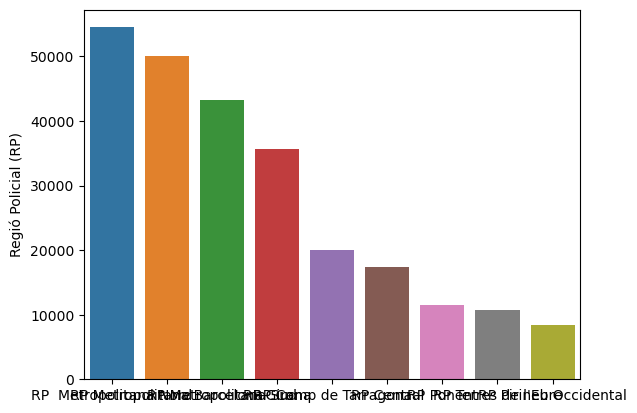

In [13]:
sns.barplot(x=df['Regió Policial (RP)'].value_counts().head(10).index, y=df['Regió Policial (RP)'].value_counts().head(10))

<AxesSubplot:xlabel='Detencions'>

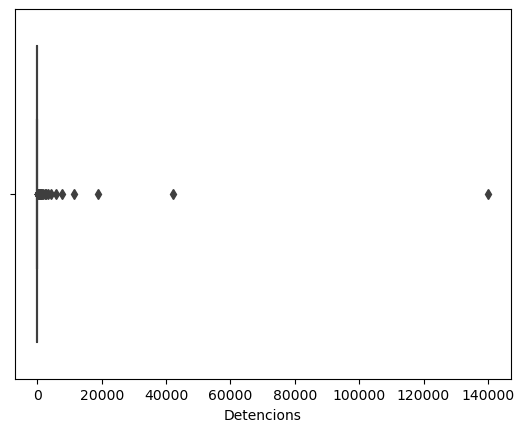

In [14]:
sns.boxplot(df.Detencions.value_counts())

In [15]:
df['Títol Codi Penal'].value_counts()

Delictes contra el patrimoni i contra l’ordre socioeconòmic                                                                85021
Delictes contra la seguretat viària                                                                                        28906
Delictes contra la llibertat                                                                                               17612
De les falsedats                                                                                                           15671
Delictes contra l'Administració de justícia                                                                                14694
Delictes contra la llibertat i la indemnitat sexuals                                                                       14577
Delictes contra l'ordre públic                                                                                             12073
Delictes contra la intimitat, el dret a la pròpia imatge i la inviolabilitat del domicili        

In [16]:
df['Tipus de fet'].value_counts()

Furt                                                        8448
Danys                                                       8387
Robatori amb força                                          8371
Lesions                                                     8354
Estafes                                                     8352
                                                            ... 
Contra l'administració justícia cort penal internacional       1
Contra la llibertat sexual                                     1
Contra la seguretat col·lectiva                                1
Contra les institucions de l'estat i divisió de poders         1
Tortures i delictes contra la integritat moral                 1
Name: Tipus de fet, Length: 117, dtype: int64

# Plots

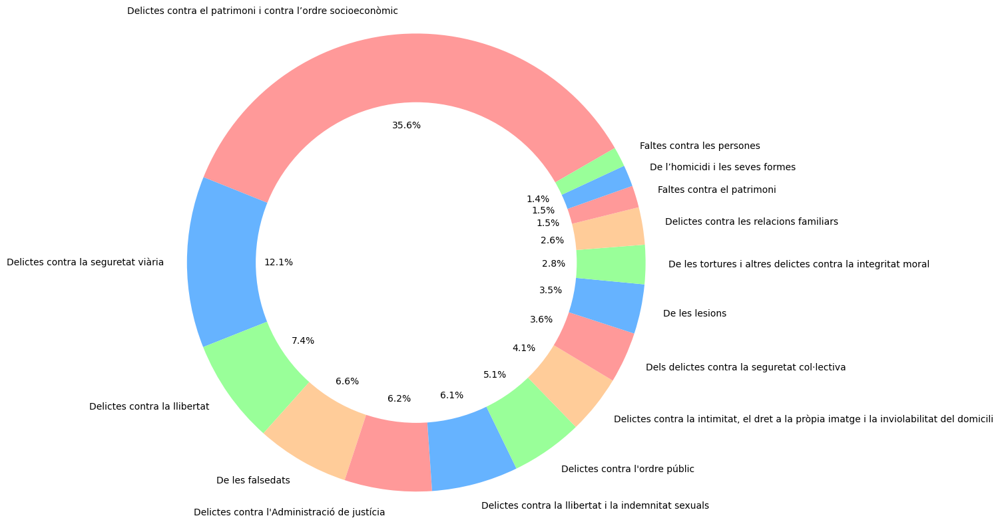

In [17]:
# Pie chart
labels = df[''].value_counts().head(15).index
sizes = df['Títol Codi Penal'].value_counts(normalize=True).head(15).values.round(6)*100
 
#colors
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']
plt.rcParams['figure.figsize'] = (14,8)

fig1, ax1 = plt.subplots()
ax1.pie(sizes, colors = colors, labels=labels, autopct='%1.1f%%', startangle=30)

#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.show()

In [18]:
pd.crosstab(index=df['Títol Codi Penal'], columns=df['Regió Policial (RP)'], margins=True)

Regió Policial (RP),RP Metropolitana Nord,RP Camp de Tarragona,RP Central,RP Girona,RP Metropolitana Barcelona,RP Metropolitana Sud,RP Pirineu Occidental,RP Ponent,RP Terres de l'Ebre,All
Títol Codi Penal,,,,,,,,,,
De les falsedats,3724,1231,742,2037,3786,2822,203,598,528,15671
De les lesions,1551,564,670,1261,1529,1410,532,422,415,8354
De les lesions al fetus,1,0,0,4,5,5,0,0,0,15
De les tortures i altres delictes contra la integritat moral,1475,534,644,909,1154,1184,203,254,254,6611
De l’avortament,11,3,0,5,9,7,1,5,1,42
De l’homicidi i les seves formes,950,315,174,407,755,654,56,196,105,3612
De l’omissió del deure d’auxili,49,26,8,30,18,26,0,8,19,184
Del tràfic d’éssers humans,55,21,14,16,131,24,2,16,9,288
Delictes contra el patrimoni i contra l’ordre socioeconòmic,17576,6451,5972,12613,17005,14715,3184,3854,3651,85021


<AxesSubplot:xlabel='count', ylabel='Àrea Bàsica Policial (ABP)'>

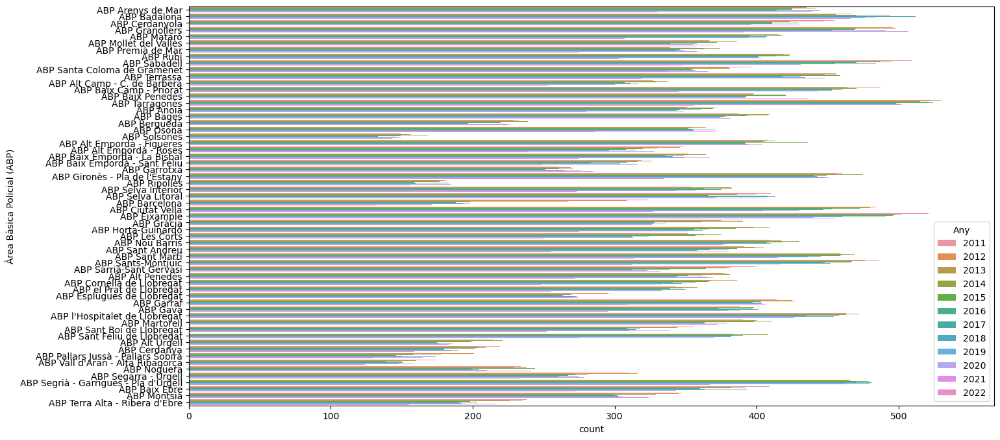

In [19]:
plt.rcParams['figure.figsize'] = (16,8)
sns.countplot(y=df['Àrea Bàsica Policial (ABP)'], hue=df['Any'])

<AxesSubplot:>

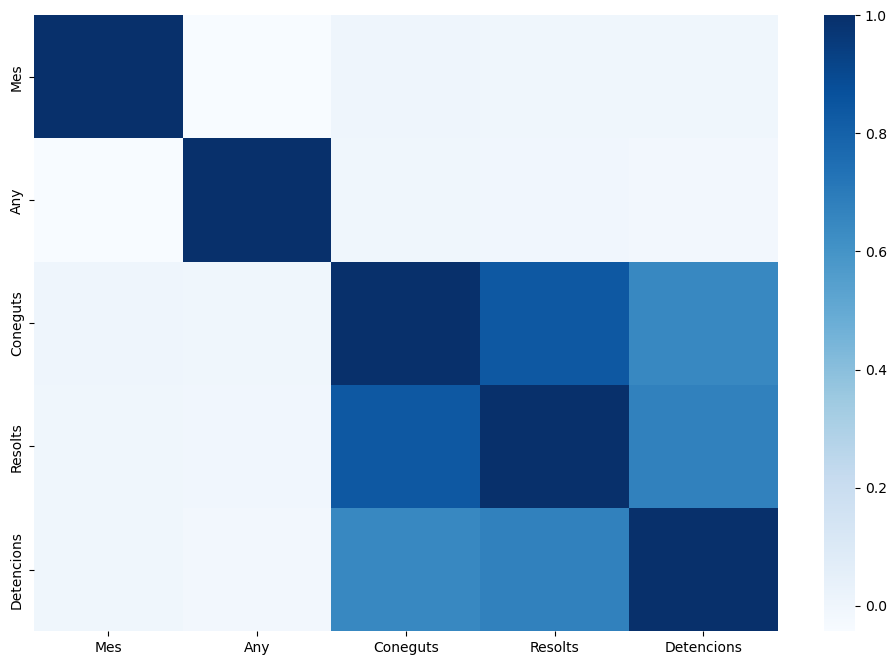

In [20]:
# Correlation Matrix

corr = df.corr()
kot = corr[corr>=.01]
plt.figure(figsize=(12,8))
sns.heatmap(corr, cmap="Blues")

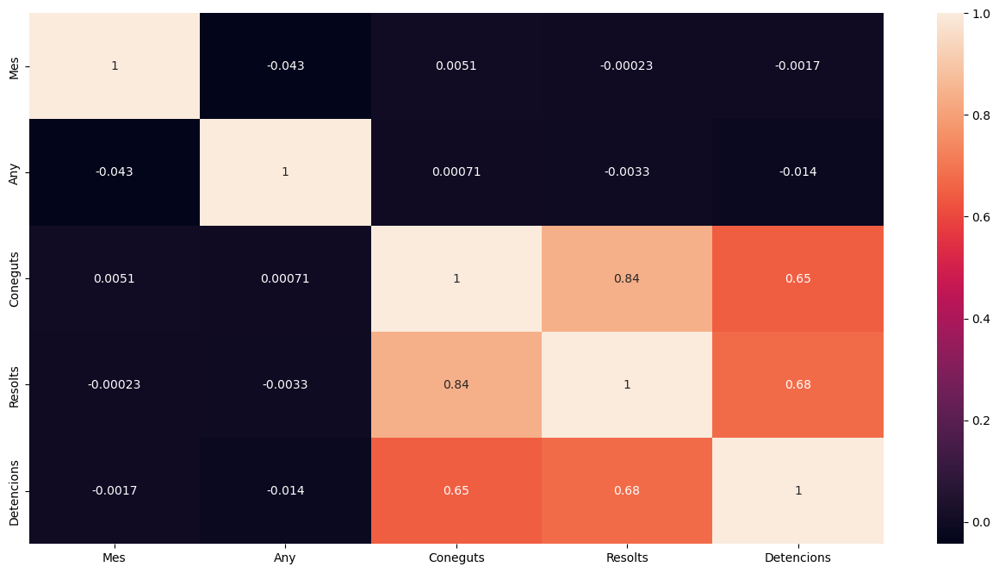

In [21]:
heat_map = sns.heatmap(corr, annot = True)
figure = heat_map.get_figure()
plt.show()

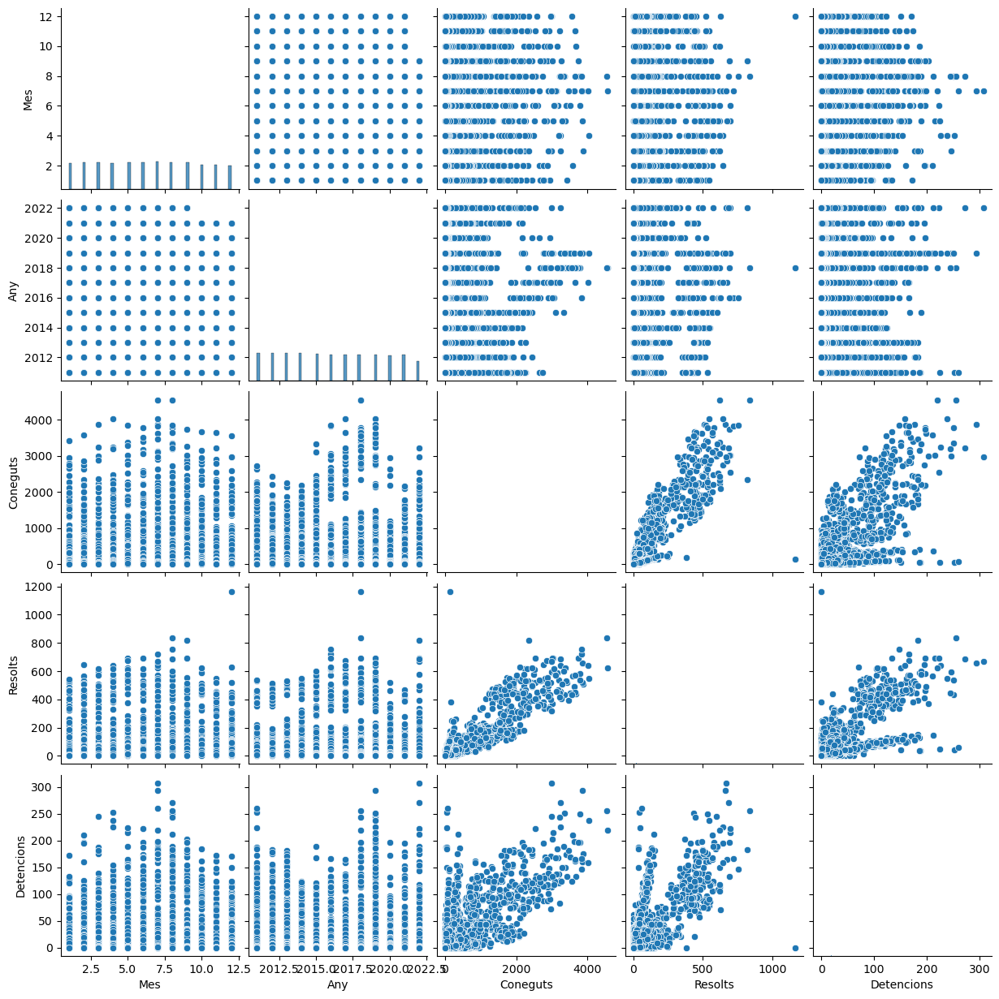

In [22]:
sns.pairplot(df)

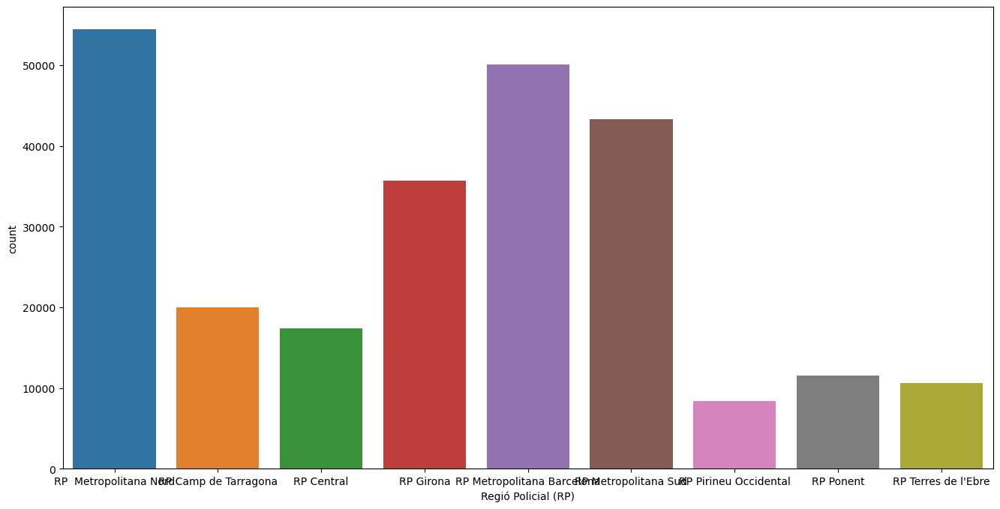

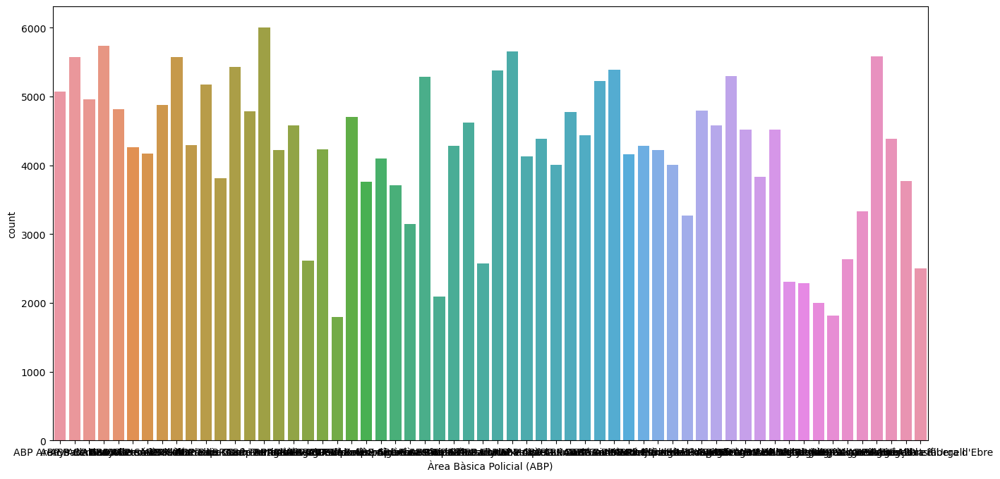

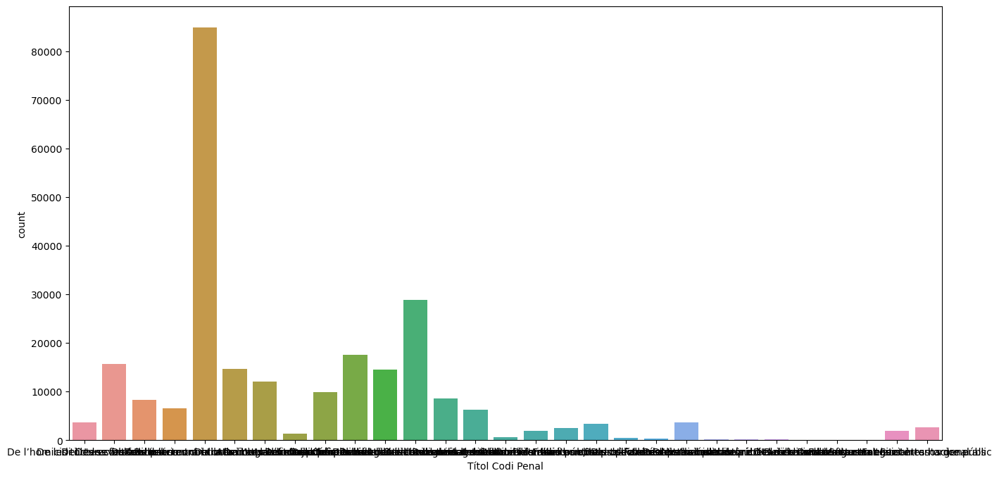

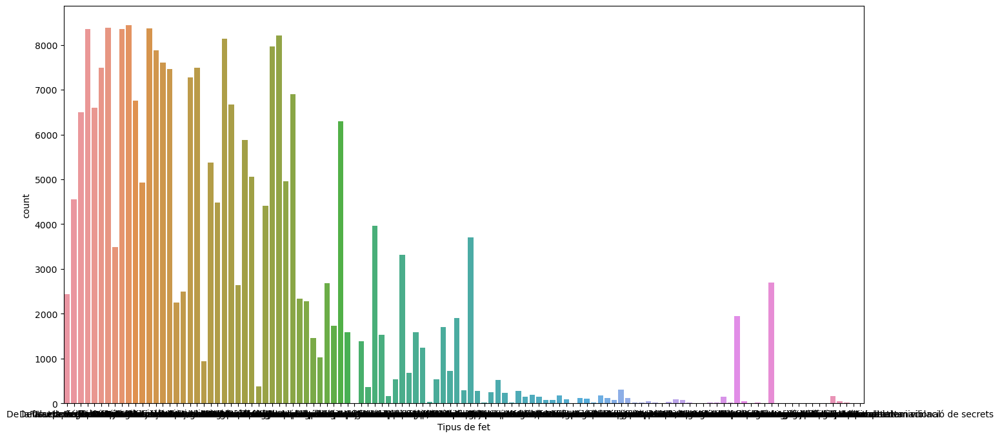

In [23]:
for column in cat_df:
    plt.figure()
    sns.countplot(x=column, data=cat_df)
    plt.show()

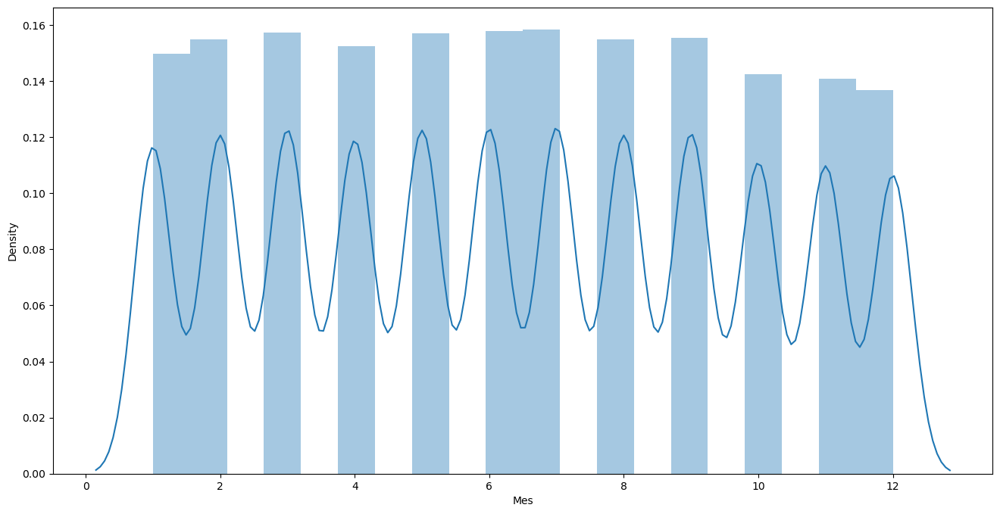

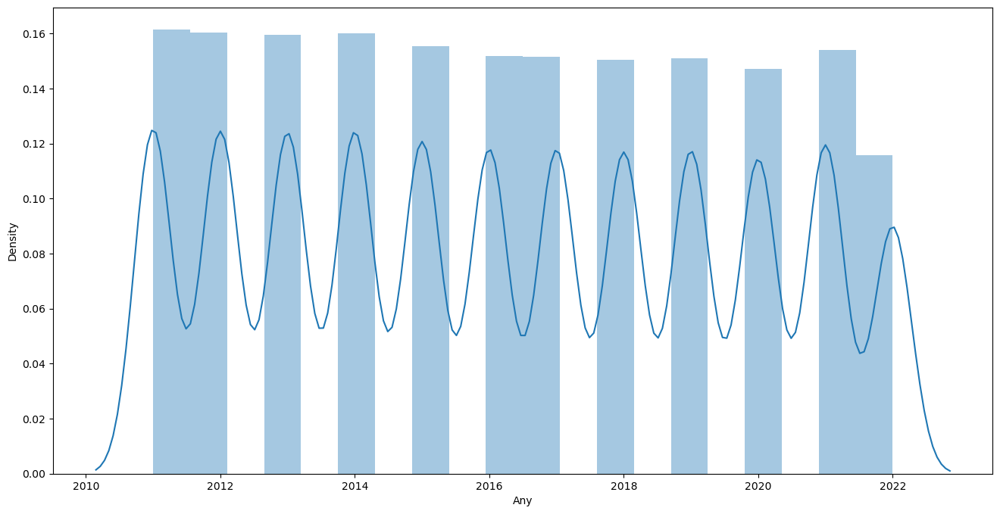

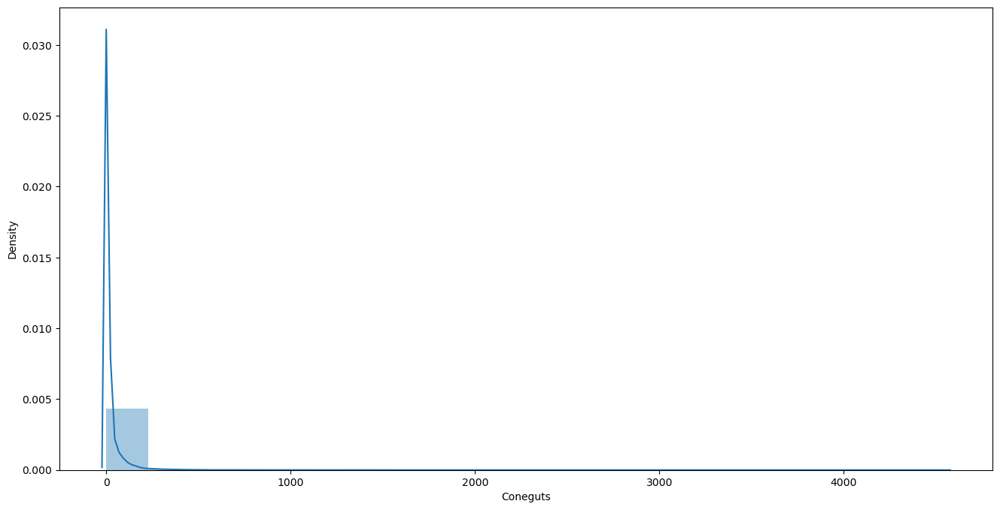

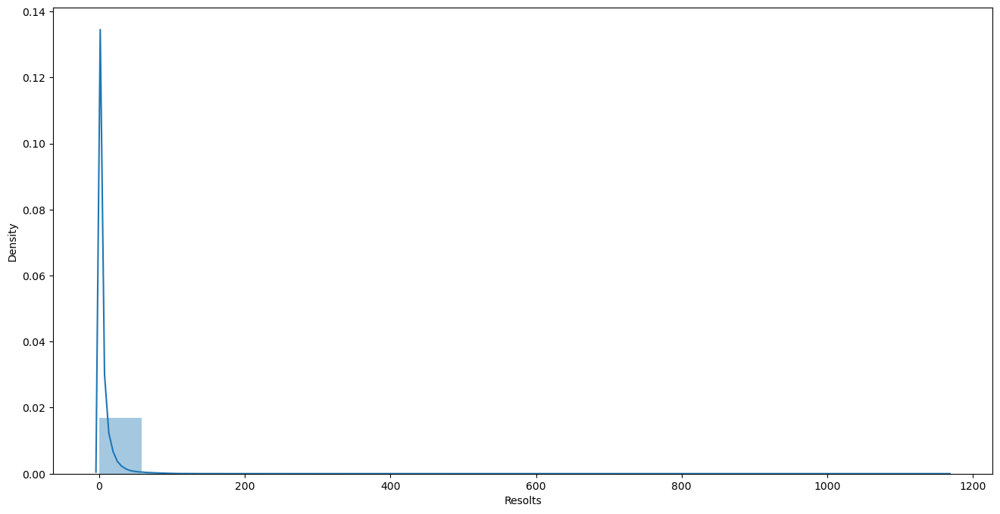

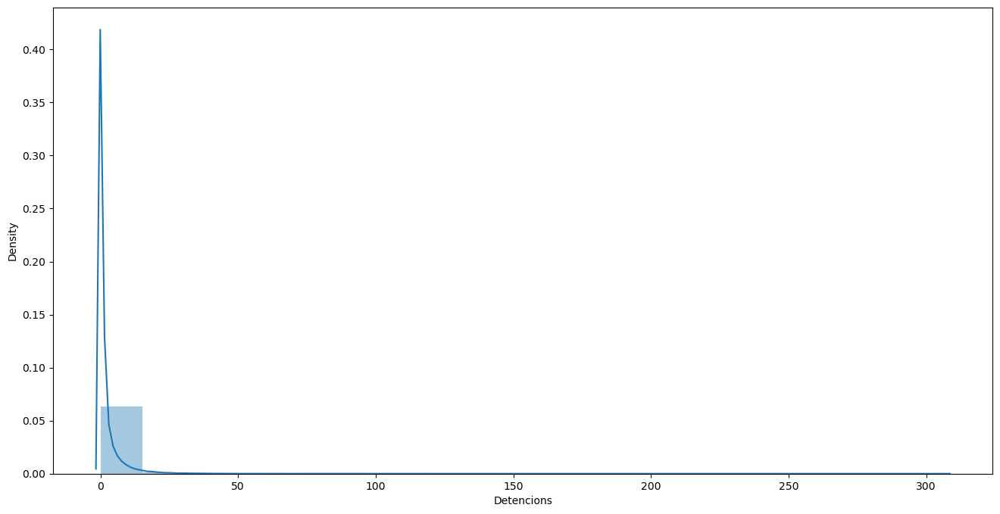

In [24]:
for column in num_df:
    sns.distplot(num_df[column], bins = 20)
    plt.show()

Mes


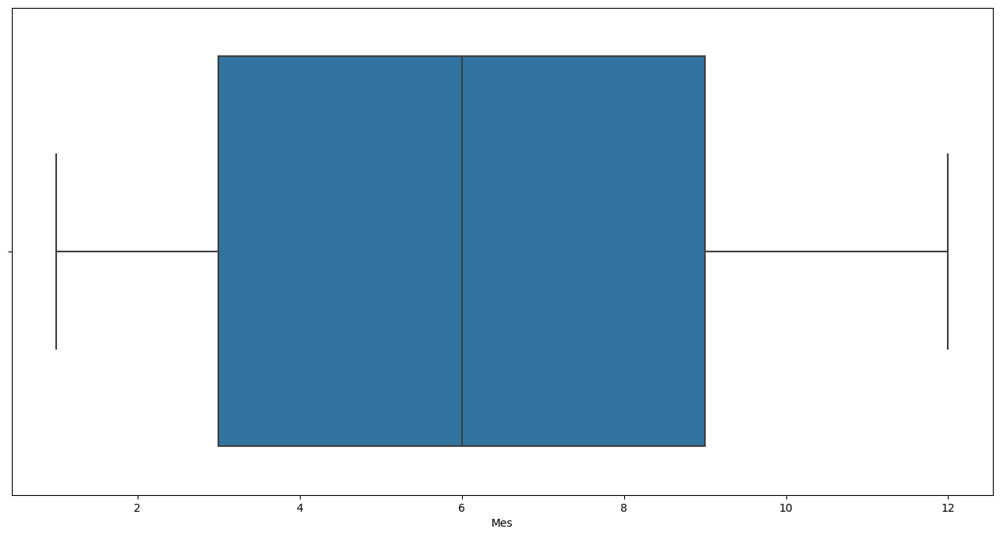

Any


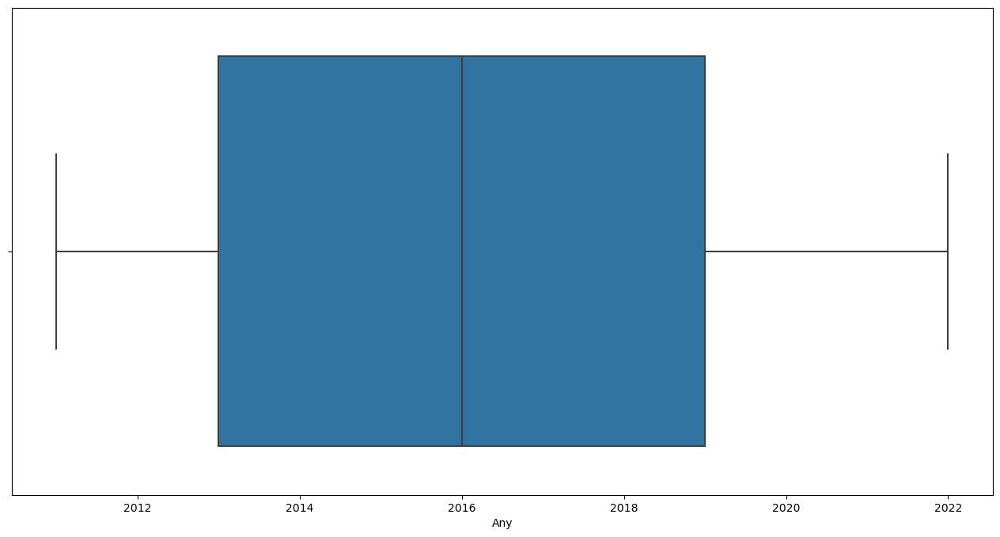

Coneguts


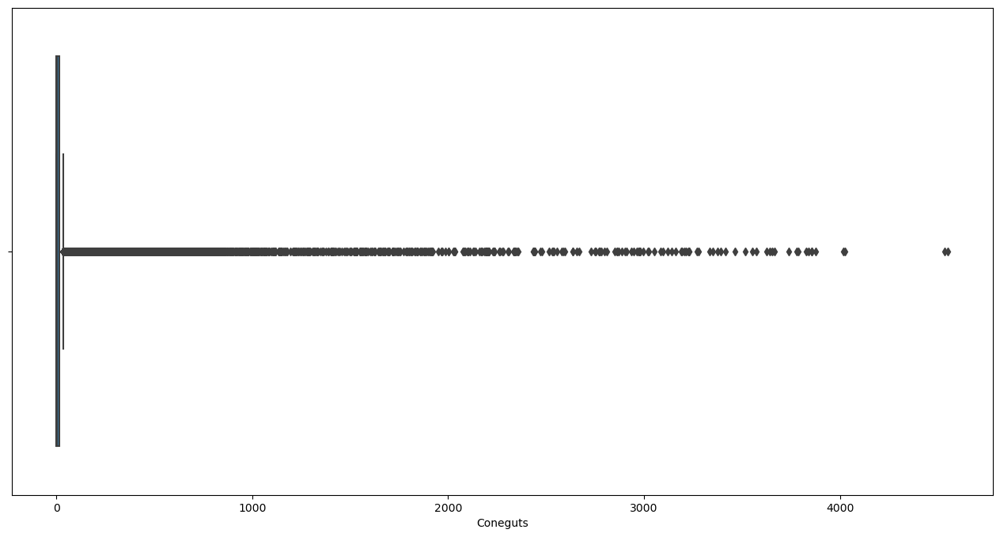

Resolts


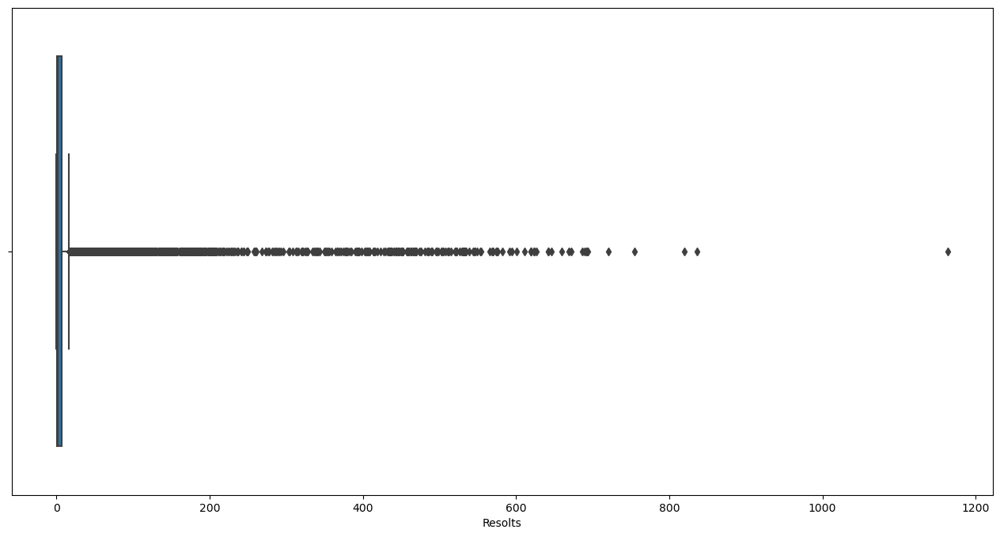

Detencions


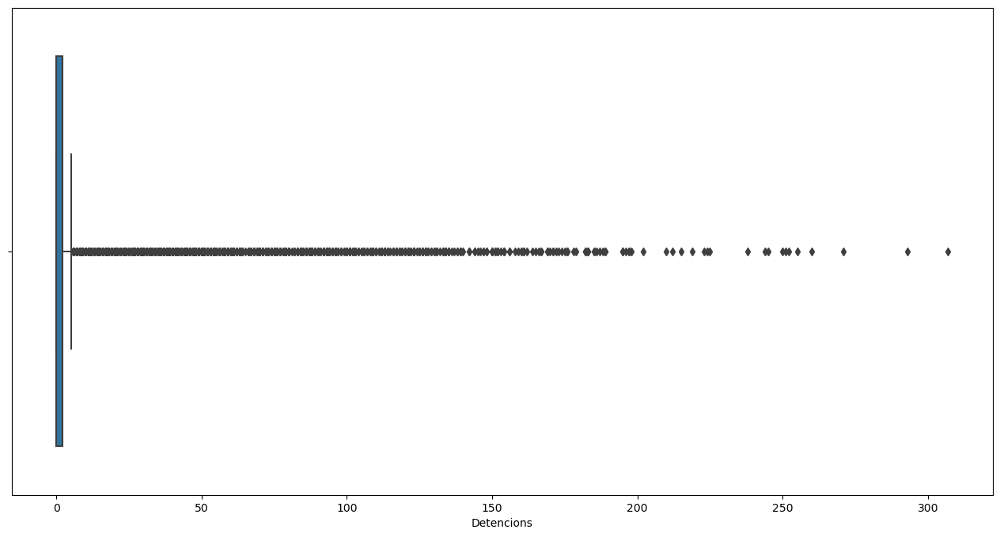

In [25]:
for item in num_df.columns:
    print(item)
    sns.boxplot(x = num_df[item])
    plt.show()

#### Feature Engineering

In [26]:
# Delete the first letters from the rows of the columns 'ABP' and 'RP'

df['Àrea Bàsica Policial (ABP)'] = df['Àrea Bàsica Policial (ABP)'].str.replace('ABP ','', regex = True)

df['Regió Policial (RP)'] = df['Regió Policial (RP)'].str.replace('RP ','', regex = True)


# Cleaning 5 values that geopy can't recognize

def clean_ABP_col(x):
    if x in ['Alt Camp - C. de Barberà']:
        return 'Alt Camp'
    else:
        return x
    
df['Àrea Bàsica Policial (ABP)'] = df['Àrea Bàsica Policial (ABP)'].apply(clean_ABP_col)

def clean_ABP_col2(x):
    if x in ["Vall d'Aran - Alta Ribagorça"]:
        return "Vall d'Aran"
    else:
        return x
    
df['Àrea Bàsica Policial (ABP)'] = df['Àrea Bàsica Policial (ABP)'].apply(clean_ABP_col2)

def clean_ABP_col3(x):
    if x in ["Bages"]:
        return "Bages, Barcelona"
    else:
        return x
    
df['Àrea Bàsica Policial (ABP)'] = df['Àrea Bàsica Policial (ABP)'].apply(clean_ABP_col3)

def clean_ABP_col4(x):
    if x in ["Gavà"]:
        return "Gavà, Barcelona"
    else:
        return x
    
df['Àrea Bàsica Policial (ABP)'] = df['Àrea Bàsica Policial (ABP)'].apply(clean_ABP_col4)


def clean_ABP_col5(x):
    if x in ["Selva Interior"]:
        return "Selva, Girona"
    else:
        return x
    
df['Àrea Bàsica Policial (ABP)'] = df['Àrea Bàsica Policial (ABP)'].apply(clean_ABP_col5)

In [27]:
# Getting columns with latitude and longitude of the places from the columns 'ABP'

from opencage.geocoder import OpenCageGeocode



key = 'c0190d2401024e20a2907e80d2438675'

geolocator = OpenCageGeocode(key)



def lat(city):
    query = str(city)
    results = geolocator.geocode(query)  
    lat =results[0]['geometry']['lat']
    
    return lat

def lon(city):
    query = str(city)
    results = geolocator.geocode(query)  
    lon =results[0]['geometry']['lng']
    
    return lon



cities = df['Àrea Bàsica Policial (ABP)'].value_counts()

cities_dic = dict(cities)

dict_cities_lat = {x: lat(x) for x in cities_dic}

dict_cities_lon = {x: lon(x) for x in cities_dic}

df['latitude'] = df['Àrea Bàsica Policial (ABP)'].map(dict_cities_lat)

df['longitude'] = df['Àrea Bàsica Policial (ABP)'].map(dict_cities_lon)

In [28]:
# Getting the population of the 'ABP' localizations 

population_dic = {'Tarragonès': 250306, 'Granollers': 60981, 'Eixample': 10866,
 "Segrià - Garrigues - Pla d'Urgell": 266658, 'Badalona': 217741, 'Sabadell': 211734, 'Baix Camp - Priorat': 199594,
 'Sants-Montjuïc': 41403, 'Ciutat Vella': 25788, "l'Hospitalet de Llobregat": 261068,
 "Gironès - Pla de l'Estany": 216639, 'Sant Martí': 221029, 'Terrassa': 218535, 'Arenys de Mar': 15942,
 'Cerdanyola': 57740, 'Rubí': 76423, 'Mataró': 126988, 'Garraf': 146876, 'Nou Barris': 168000,
 'Baix Penedès': 100262, 'Alt Empordà - Figueres': 180595, 'Selva Litoral': 167694, 'Bages, Barcelona': 175527,
 'Gavà, Barcelona': 46974, 'Sant Feliu de Llobregat': 45642, 'Martorell': 27850, 'Sant Andreu': 27332,
 'Baix Ebre': 80637, 'Horta-Guinardó': 169920, 'Selva, Girona': 3697, 'Santa Coloma de Gramenet': 117375,
 'Alt Penedès': 106262, 'Mollet del Vallès': 51294, 'Osona': 154559, 'Cornellà de Llobregat': 87173,
 'Anoia': 117842, 'Premià de Mar': 28071, 'Sarrià-Sant Gervasi': 148172, 'Gràcia': 123973,
 'Baix Empordà - La Bisbal': 10859, 'el Prat de Llobregat': 65030, 'Les Corts': 82588,
 'Sant Boi de Llobregat': 82904, 'Alt Camp': 44578, 'Montsià': 69613, 'Alt Empordà - Roses': 19319,
 'Baix Empordà - Sant Feliu': 21824, 'Segarra - Urgell': 20996, 'Esplugues de Llobregat': 46414,
 'Garrotxa': 55999, 'Noguera': 39376, 'Berguedà': 40039, 'Barcelona': 1620000, "Terra Alta - Ribera d'Ebre": 12885,
 'Alt Urgell': 20878, 'Cerdanya': 18063, 'Ripollès': 25700, 'Pallars Jussà - Pallars Sobirà': 7220,
 "Vall d'Aran": 9993,
 'Solsonès': 13497}



df['population'] = df['Àrea Bàsica Policial (ABP)'].map(population_dic)

In [29]:
df

,Mes,Any,Regió Policial (RP),Àrea Bàsica Policial (ABP),Títol Codi Penal,Tipus de fet,Coneguts,Resolts,Detencions,latitude,longitude,population
0,1,2021,Metropolitana Nord,Arenys de Mar,De l’homicidi i les seves formes,Homicidi,0,1,1,41.5797,2.5492,15942
1,1,2021,Metropolitana Nord,Arenys de Mar,De les falsedats,De la usurpació de l'estat civil,3,1,0,41.5797,2.5492,15942
2,1,2021,Metropolitana Nord,Arenys de Mar,De les falsedats,Falsedats documentals,5,0,0,41.5797,2.5492,15942
3,1,2021,Metropolitana Nord,Arenys de Mar,De les lesions,Lesions,39,33,7,41.5797,2.5492,15942
4,1,2021,Metropolitana Nord,Arenys de Mar,De les tortures i altres delictes contra la in...,Tracte degradant / vexatori,2,1,1,41.5797,2.5492,15942
...,...,...,...,...,...,...,...,...,...,...,...,...
251671,9,2022,Camp de Tarragona,Tarragonès,Delictes contra la seguretat viària,Negativa a sotmetre's a les proves,1,1,0,41.1548,1.2983,250306
251672,9,2022,Camp de Tarragona,Tarragonès,Delictes contra les relacions familiars,Contra els drets i deures familiars,2,2,0,41.1548,1.2983,250306
251673,9,2022,Camp de Tarragona,Tarragonès,Dels delictes contra la seguretat col·lectiva,Contra la salut pública,19,17,26,41.1548,1.2983,250306
251674,9,2022,Camp de Tarragona,Tarragonès,Dels delictes relatius a l’ordenació del terri...,"Protecció de la flora, fauna i animals domèstics",1,0,0,41.1548,1.2983,250306


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 251676 entries, 0 to 251675
Data columns (total 12 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Mes                         251676 non-null  int64  
 1   Any                         251676 non-null  int64  
 2   Regió Policial (RP)         251676 non-null  object 
 3   Àrea Bàsica Policial (ABP)  251676 non-null  object 
 4   Títol Codi Penal            251220 non-null  object 
 5   Tipus de fet                251220 non-null  object 
 6   Coneguts                    251676 non-null  int64  
 7   Resolts                     251676 non-null  int64  
 8   Detencions                  251676 non-null  int64  
 9   latitude                    251676 non-null  float64
 10  longitude                   251676 non-null  float64
 11  population                  251676 non-null  int64  
dtypes: float64(2), int64(6), object(4)
memory usage: 23.0+ MB


#### Creating the Animation

In [31]:
new_lat = []
new_lon = []

lat_lon = df.iloc[: , [9, 10]]

# I'm going to randomize the points of the latitude/longitude to be able to apreciate
# the amount of datapoints there is in each localization

for item in lat_lon.latitude:
    new_lat.append(random.uniform(-0.05, 0.05))
    
for item in lat_lon.longitude:
    new_lon.append(random.uniform(-0.05, 0.05))



df_lat = pd.DataFrame(new_lat)

df_lat['new_lat'] = df_lat[0]

df_lat = df_lat.drop(columns = 0)



df_lon = pd.DataFrame(new_lon)

df_lon['new_lon'] = df_lon[0]

df_lon = df_lon.drop(columns = 0)



df['latitude'] = df['latitude'] + df_lat['new_lat']

df['longitude'] = df['longitude'] + df_lon['new_lon']



lat_lis = lat_lon.latitude.to_list()
lon_lis = lat_lon.longitude.to_list()

In [32]:
# Kmeans
from sklearn.cluster import MiniBatchKMeans
kmeans = MiniBatchKMeans(4) # manual tunning
kmeans.fit(lat_lon)

lat_lon = lat_lon.sample(2000) # Para no sobrecargar la visualizacion
lat_lon.loc[:, 'cluster'] = kmeans.predict(lat_lon)

In [33]:
cols

Index(['Mes', 'Any', 'Regió Policial (RP)', 'Àrea Bàsica Policial (ABP)',
       'Títol Codi Penal', 'Tipus de fet', 'Coneguts', 'Resolts',
       'Detencions'],
      dtype='object')

In [34]:
import plotly.express as px

fig = px.scatter_mapbox(lat_lon, lat = 'latitude', lon = 'longitude', color = 'cluster', zoom = 10, 
                       mapbox_style = 'carto-positron')
fig.show()

In [35]:
from sklearn.cluster import KMeans
kmeans2 = KMeans(4)
kmeans2.fit(lat_lon)



lat_lon = lat_lon.sample(1000) # Para no sobrecargar la visualizacion
lat_lon.loc[:, 'cluster2'] = kmeans2.predict(lat_lon)



fig = px.scatter_mapbox(lat_lon, lat = 'latitude', lon = 'longitude', color = 'cluster2', zoom = 10, 
                       mapbox_style = 'carto-positron')
fig.show()

In [36]:
df_s = df.sample(24000).sort_values('Any')

fig = px.scatter_mapbox(df_s, lat = 'latitude', lon = 'longitude', color = 'Regió Policial (RP)', animation_frame ='Títol Codi Penal', zoom = 10, mapbox_style = 'carto-positron')

fig.show()

In [80]:
df_s = df.sample(24000).sort_values('Any')

fig = px.scatter_mapbox(df_s, lat = 'latitude', lon = 'longitude', color = 'Regió Policial (RP)', animation_frame ='Any', zoom = 10, mapbox_style = 'carto-positron')

fig.show()

# Hypothesis Testing

In [38]:
df.columns

Index(['Mes', 'Any', 'Regió Policial (RP)', 'Àrea Bàsica Policial (ABP)',
       'Títol Codi Penal', 'Tipus de fet', 'Coneguts', 'Resolts', 'Detencions',
       'latitude', 'longitude', 'population'],
      dtype='object')

In [87]:
# Null hypothesis

$H_{0}$: The amount of population has NO effect on the rate of arrested people

In [88]:
# Alternate hypothesis

$H_{1}$: The amount of population has effect on the rate of arrested people

In [81]:
# Converting the columns in arrays
pop = df['population'].sample(500)
arr = df['Detencions'].sample(500)

pop = np.array(pop)
arr =np.array(arr)

In [82]:
cols

Index(['Mes', 'Any', 'Regió Policial (RP)', 'Àrea Bàsica Policial (ABP)',
       'Títol Codi Penal', 'Tipus de fet', 'Coneguts', 'Resolts',
       'Detencions'],
      dtype='object')

In [93]:
# test for a Normal distribution: Shapiro test

def check_normality(data, significance):
    test_stat_normality , p_value_normality = stats.shapiro(data)
    print("pvalue", p_value_normality)
    if p_value_normality < significance:
        print("reject null hypothesis: data not Normally distributed")
    else:
        print("no evidence to reject the null hypothesis: data sampled from Normal")

In [94]:
check_normality(arr, 0.05)
check_normality(pop, 0.05)

pvalue 1.729350439936916e-34
reject null hypothesis: data not Normally distributed
pvalue 3.751750188397863e-37
reject null hypothesis: data not Normally distributed


In [85]:
# ANOVA test

F, p_value = stats.f_oneway(arr, pop)
print("p value:%.4f" % p_value)
if p_value <0.05:
    print("Reject null hypothesis")
else:
    print("Fail to reject null hypothesis")

p value:0.0000
Reject null hypothesis


##### It can be concluded that the alternative hypothesis is the correct one so the population has effect on the amount of arrested people because after we did the ANOVA test the p-value is less than 0.05

# Preprocessing

In [46]:
# Let's make a copy of the original dataset

df_copy = df

In [47]:
df.isna().sum()

df = df.dropna()


In [48]:
df.shape

(251220, 12)

In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 251220 entries, 0 to 251674
Data columns (total 12 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Mes                         251220 non-null  int64  
 1   Any                         251220 non-null  int64  
 2   Regió Policial (RP)         251220 non-null  object 
 3   Àrea Bàsica Policial (ABP)  251220 non-null  object 
 4   Títol Codi Penal            251220 non-null  object 
 5   Tipus de fet                251220 non-null  object 
 6   Coneguts                    251220 non-null  int64  
 7   Resolts                     251220 non-null  int64  
 8   Detencions                  251220 non-null  int64  
 9   latitude                    251220 non-null  float64
 10  longitude                   251220 non-null  float64
 11  population                  251220 non-null  int64  
dtypes: float64(2), int64(6), object(4)
memory usage: 24.9+ MB


In [50]:
df['Detencions'].value_counts()

0      139707
1       41973
2       18826
3       11218
4        7612
        ...  
81          1
170         1
165         1
158         1
212         1
Name: Detencions, Length: 202, dtype: int64

In [51]:
# After exploring the data I decided that I'm going to reduce my dataset to just the features where the column
# 'Detencions' and 'Resolts' are binary, that way I want to see If I can predict if the criminal is arrested or not.
# so df['Detencions'] it's going to be my target variable.

df = df[df['Resolts'] == 1]

df = df[df['Detencions'] < 2]

df.shape

(60704, 12)

In [52]:
# X & y Split

X = df.iloc[:, [2, 3, 4, 5, 6, 7, 11]]

y = df.loc[:,'Detencions']

In [53]:
# Encoding categorical features and standardizing numeric features

from sklearn.compose import make_column_transformer


ste = StandardScaler()
ode = OrdinalEncoder()


ct = make_column_transformer(
    (ste, ['Coneguts', 'population']),
    (ode, ['Regió Policial (RP)','Àrea Bàsica Policial (ABP)', 'Títol Codi Penal', 'Tipus de fet' ]),
    remainder='passthrough')


X = ct.fit_transform(X)

#Encoding target variable
#encoder = LabelEncoder()
#y_train = encoder.fit_transform(y_train)
#y_test = encoder.transform(y_test)

In [54]:
#Train/Test/Val split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)

print("Nb rows X_train = {}".format(len(X_train)))
print("Nb rows X_test = {}".format(len(X_test)))
print("Nb rows y_train = {}".format(len(y_train)))
print("Nb rows y_test = {}".format(len(y_test)))
print("Nb rows X_val = {}".format(len(X_val)))
print("Nb rows y_val = {}".format(len(y_val)))


Nb rows X_train = 36422
Nb rows X_test = 12141
Nb rows y_train = 36422
Nb rows y_test = 12141
Nb rows X_val = 12141
Nb rows y_val = 12141


## MODELING

In [56]:
model1 = LGBMClassifier()
model2 = GradientBoostingClassifier()
model3 = LogisticRegression()
model4 = AdaBoostClassifier()

model5 = DecisionTreeClassifier()
model6 = RandomForestClassifier()

In [128]:
def model_inplace(model):

    model.fit(X_train, y_train)

    pred_test = model.predict(X_test)
    
    
    print(classification_report(y_test, pred_test))
    
    print(f1_score(y_test, pred_test))
    

    _ , ax = plt.subplots()
    ax.set(title="Confusion Matrix on Test set")
    ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, ax=ax)
    
    return r2_score

In [130]:
def Tree_Forest(model, forest):

    model.fit(X_train, y_train)
    
    # Evaluation of the model
 
    pred_test = model.predict(X_test)
        
    print(classification_report(y_test, pred_test))
    
    print(f1_score(y_test, pred_test))

    _ , ax = plt.subplots()
    ax.set(title="Confusion Matrix on Test set") 
    ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, ax=ax)

              precision    recall  f1-score   support

           0       0.83      0.95      0.89      9456
           1       0.65      0.32      0.43      2685

    accuracy                           0.81     12141
   macro avg       0.74      0.63      0.66     12141
weighted avg       0.79      0.81      0.79     12141

0.42635270541082165


<function sklearn.metrics._regression.r2_score(y_true, y_pred, *, sample_weight=None, multioutput='uniform_average', force_finite=True)>

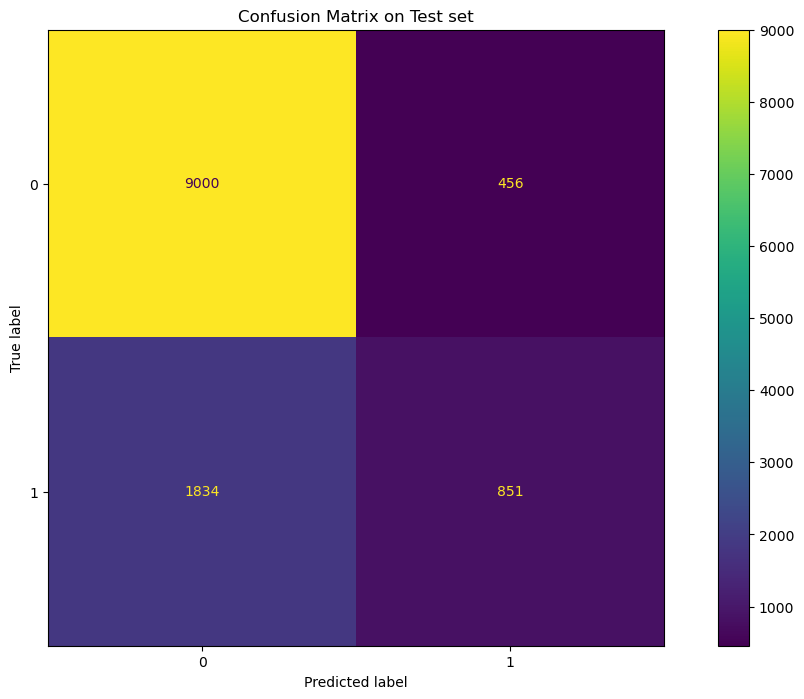

In [131]:
# model1 = LGBMClassifier()

model_inplace(model1)

              precision    recall  f1-score   support

           0       0.82      0.97      0.89      9456
           1       0.68      0.27      0.38      2685

    accuracy                           0.81     12141
   macro avg       0.75      0.62      0.64     12141
weighted avg       0.79      0.81      0.78     12141

0.3829444891391794


<function sklearn.metrics._regression.r2_score(y_true, y_pred, *, sample_weight=None, multioutput='uniform_average', force_finite=True)>

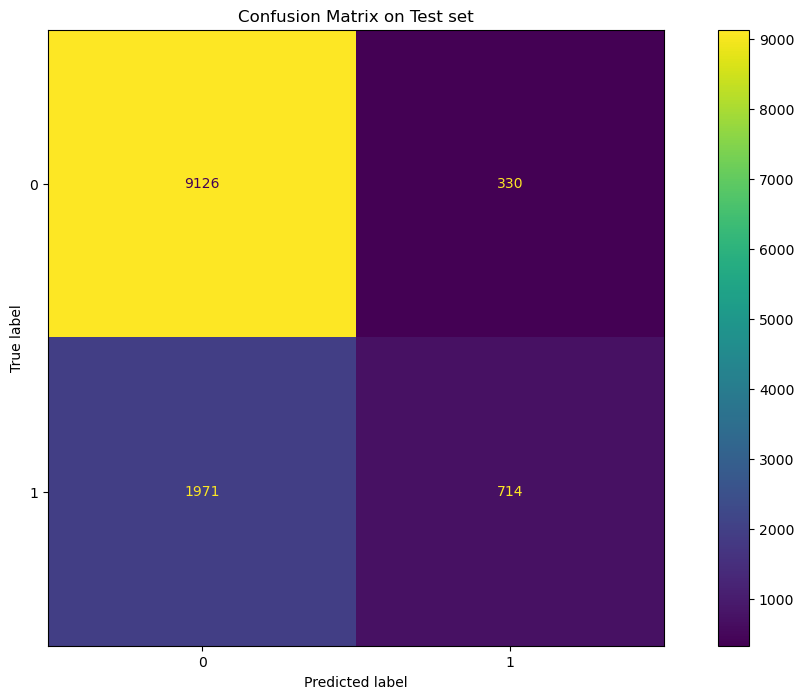

In [132]:
#model2 = GradientBoostingClassifier()

model_inplace(model2)

              precision    recall  f1-score   support

           0       0.78      1.00      0.88      9456
           1       0.50      0.00      0.00      2685

    accuracy                           0.78     12141
   macro avg       0.64      0.50      0.44     12141
weighted avg       0.72      0.78      0.68     12141

0.0029706646862235424


<function sklearn.metrics._regression.r2_score(y_true, y_pred, *, sample_weight=None, multioutput='uniform_average', force_finite=True)>

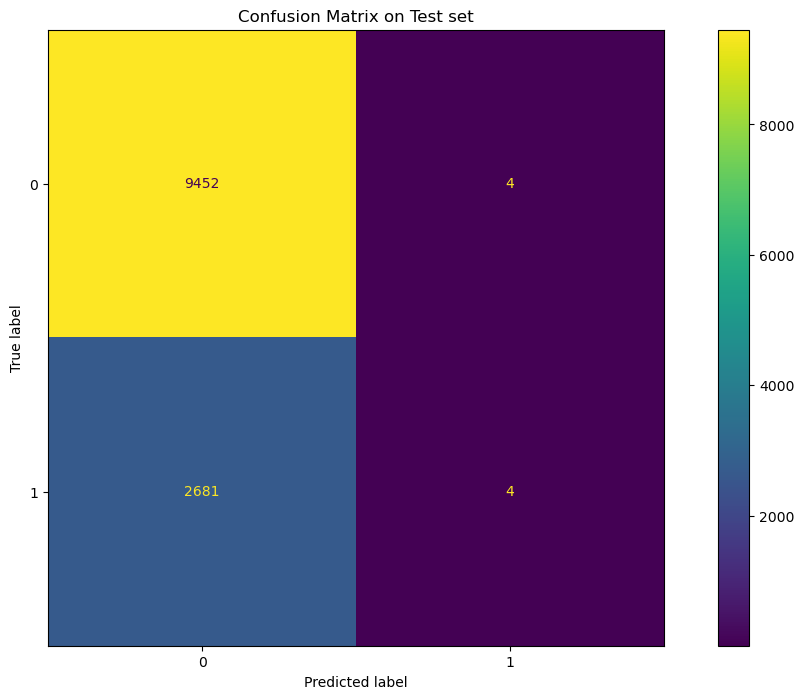

In [133]:
# model3 = LogisticRegression()

model_inplace(model3)

              precision    recall  f1-score   support

           0       0.81      0.96      0.88      9456
           1       0.62      0.22      0.33      2685

    accuracy                           0.80     12141
   macro avg       0.72      0.59      0.60     12141
weighted avg       0.77      0.80      0.76     12141

0.32768052516411383


<function sklearn.metrics._regression.r2_score(y_true, y_pred, *, sample_weight=None, multioutput='uniform_average', force_finite=True)>

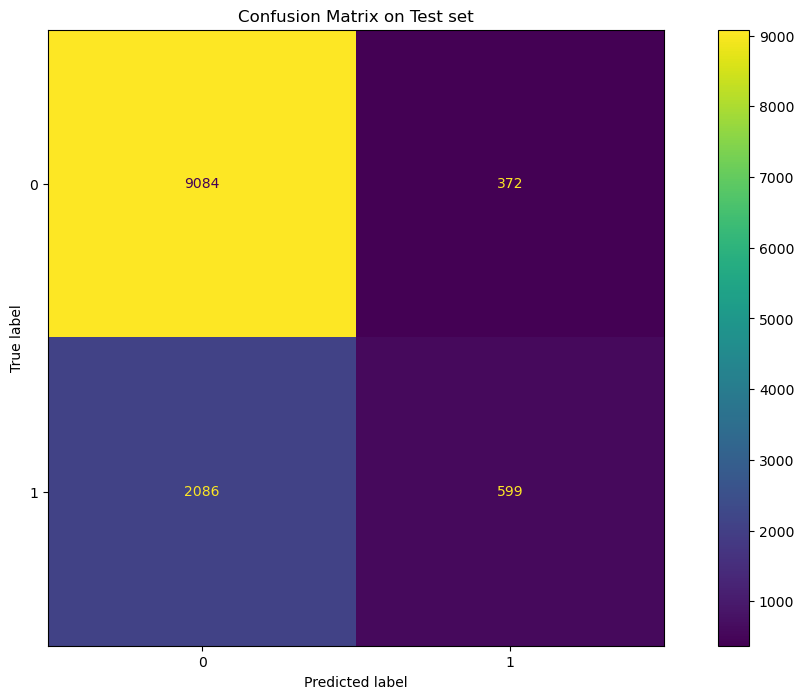

In [134]:
# model4 = AdaBoostClassifier()

model_inplace(model4)

              precision    recall  f1-score   support

           0       0.84      0.90      0.87      9456
           1       0.52      0.38      0.44      2685

    accuracy                           0.79     12141
   macro avg       0.68      0.64      0.65     12141
weighted avg       0.77      0.79      0.77     12141

0.43768996960486317


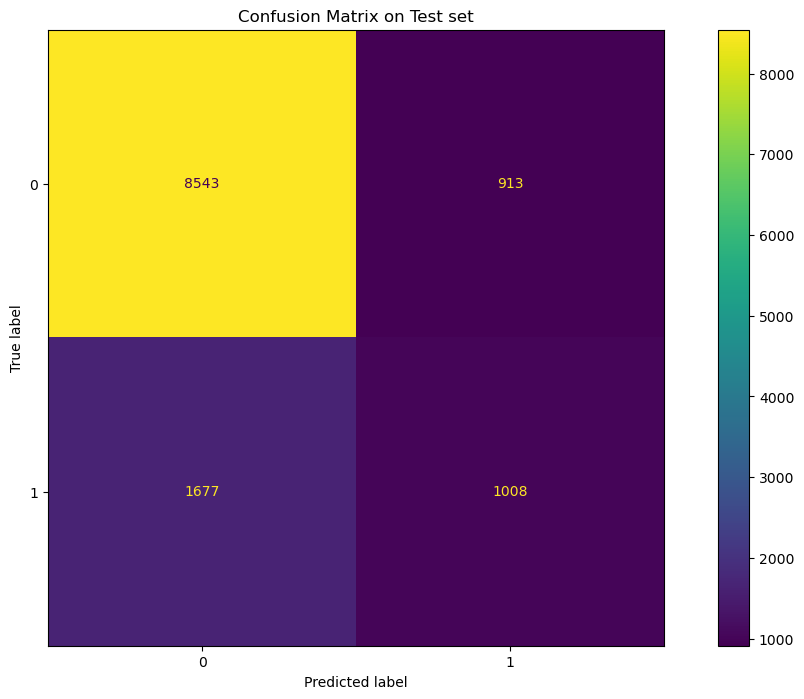

In [135]:
# model5 = DecisionTreeClassifier()

Tree_Forest(model5, 4)

              precision    recall  f1-score   support

           0       0.84      0.90      0.87      9456
           1       0.53      0.40      0.45      2685

    accuracy                           0.79     12141
   macro avg       0.68      0.65      0.66     12141
weighted avg       0.77      0.79      0.78     12141

0.4524617996604415


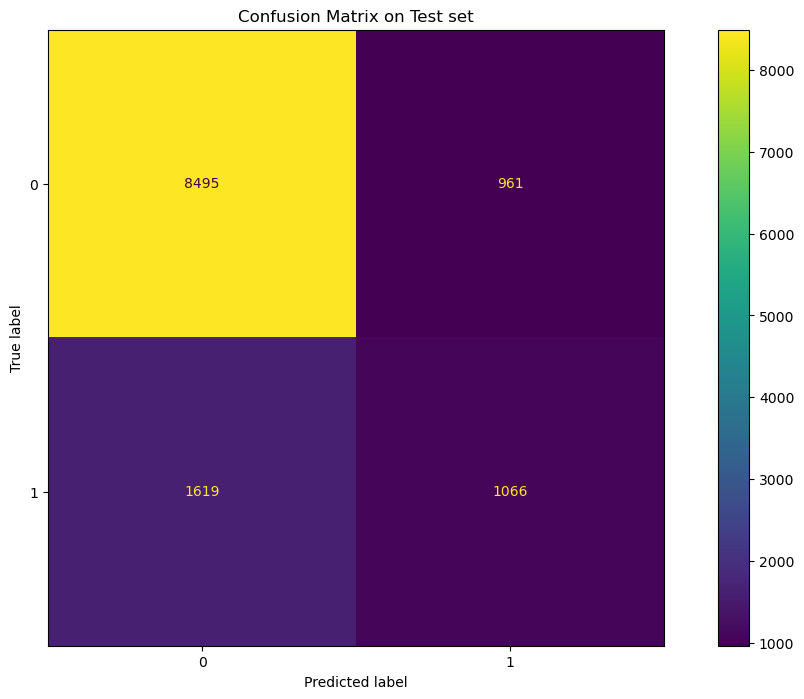

In [136]:
# model6 = RandomForestClassifier()

Tree_Forest(model6, 200)

# First correction imbalance: oversampling 

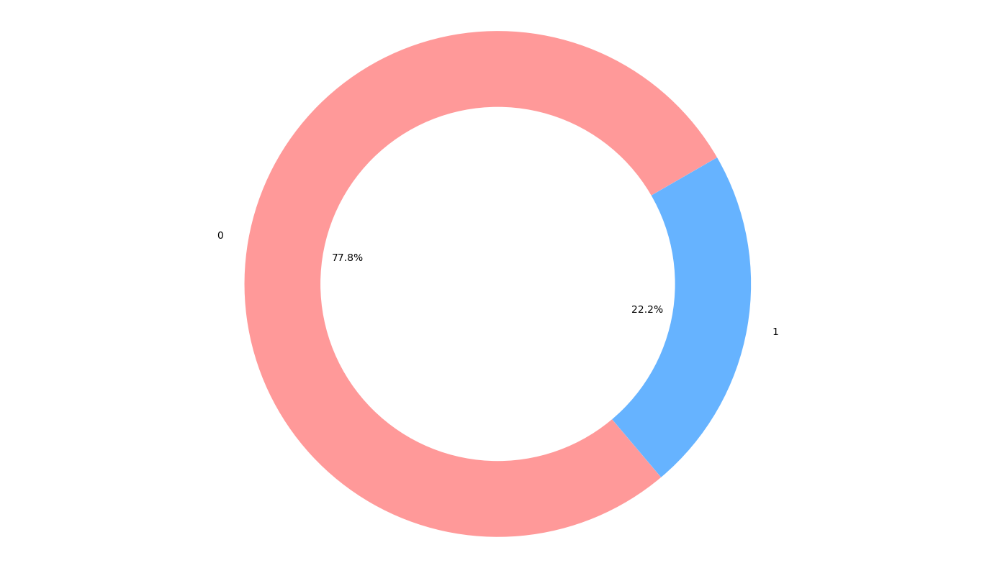

<Figure size 1400x800 with 0 Axes>

In [100]:
# Pie chart
labels = df['Detencions'].value_counts().index
sizes = df['Detencions'].value_counts(normalize=True).values.round(6)*100
 
#colors
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']
plt.rcParams['figure.figsize'] = (14,8)

fig1, ax1 = plt.subplots()
ax1.pie(sizes, colors = colors, labels=labels, autopct='%1.1f%%', startangle=30)

#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.show()
#plt.savefig('imbalance.png')

## SMOTE method

In [65]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(k_neighbors=3)

X_train_SMOTE, y_train_SMOTE = sm.fit_resample(X_train, y_train)

In [66]:
print(X_train.shape)
print(X_train_SMOTE.shape)

(36422, 7)
(56752, 7)


In [67]:
print(y_train.value_counts()/len(y_train))

print(y_train_SMOTE.value_counts()/len(y_train_SMOTE))

0   0.7791
1   0.2209
Name: Detencions, dtype: float64
1   0.5000
0   0.5000
Name: Detencions, dtype: float64


In [137]:
def model_inplace_SMOTE(model):

    model.fit(X_train_SMOTE, y_train_SMOTE)

    pred_test = model.predict(X_test)
    
    print(classification_report(y_test, pred_test))
    
    print(f1_score(y_test, pred_test))

    _ , ax = plt.subplots()
    ax.set(title="Confusion Matrix on Test set")
    ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, ax=ax)

In [138]:
def Tree_Forest_SMOTE(model, forest):

    model.fit(X_train, y_train)
    
    # Evaluation of the model
 
    pred_test = model.predict(X_test)
        
    print(classification_report(y_test, pred_test))
    
    print(f1_score(y_test, pred_test))
    
    _ , ax = plt.subplots()
    ax.set(title="Confusion Matrix on Test set") 
    ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, ax=ax) 

              precision    recall  f1-score   support

           0       0.90      0.77      0.83      9456
           1       0.47      0.71      0.57      2685

    accuracy                           0.76     12141
   macro avg       0.69      0.74      0.70     12141
weighted avg       0.81      0.76      0.77     12141

0.5651468201268998


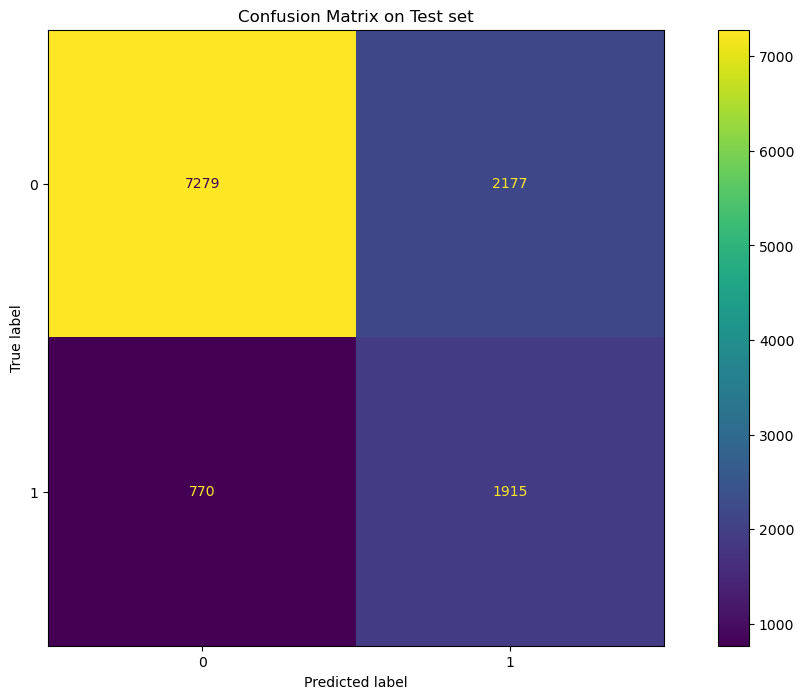

In [139]:
# LGBMClassifier()
model_inplace_SMOTE(model1)

              precision    recall  f1-score   support

           0       0.84      0.90      0.87      9456
           1       0.53      0.40      0.46      2685

    accuracy                           0.79     12141
   macro avg       0.69      0.65      0.66     12141
weighted avg       0.77      0.79      0.78     12141

0.459447983014862


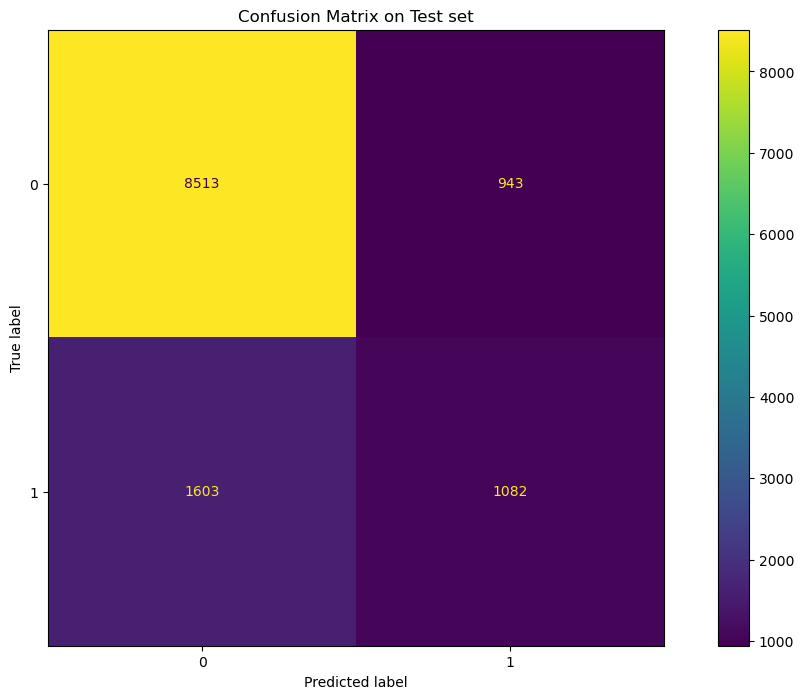

In [140]:
# Random Forest
Tree_Forest_SMOTE(model6, 100)

## Hyper Tunning

In [72]:
model_tuned = LGBMClassifier(bagging_fraction=0.6, bagging_freq=4, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.9,
               importance_type='split', learning_rate=0.05, max_depth=-1,
               min_child_samples=96, min_child_weight=0.001, min_split_gain=0.7,
               n_estimators=180, n_jobs=-1, num_leaves=10, objective=None,
               random_state=123, reg_alpha=0.0001, reg_lambda=0.1,
               silent='warn', subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)

In [73]:
model_tuned.fit(X_train_SMOTE, y_train_SMOTE)

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


LGBMClassifier(bagging_fraction=0.6, bagging_freq=4, feature_fraction=0.9,
               learning_rate=0.05, min_child_samples=96, min_split_gain=0.7,
               n_estimators=180, num_leaves=10, random_state=123,
               reg_alpha=0.0001, reg_lambda=0.1)

              precision    recall  f1-score   support

           0       0.91      0.75      0.82      9456
           1       0.46      0.74      0.56      2685

    accuracy                           0.75     12141
   macro avg       0.68      0.74      0.69     12141
weighted avg       0.81      0.75      0.77     12141



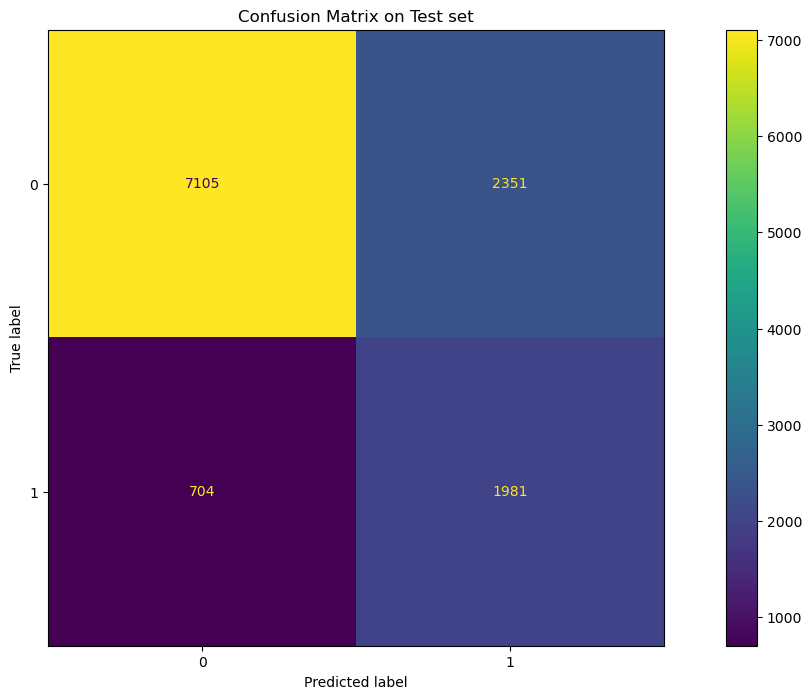

In [74]:
# LGBMClassifier()
model_inplace_SMOTE(model_tuned)